# Face Recognition using PCA

Import some libraries

In [248]:
import os
import cv2
import random
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import  matplotlib.image as mpimg
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

## Part 1 - Visualizing the Face Images

### 1. Visualize randomly selected 16 faces in a 4×4 grid [4 rows and 4 columns].

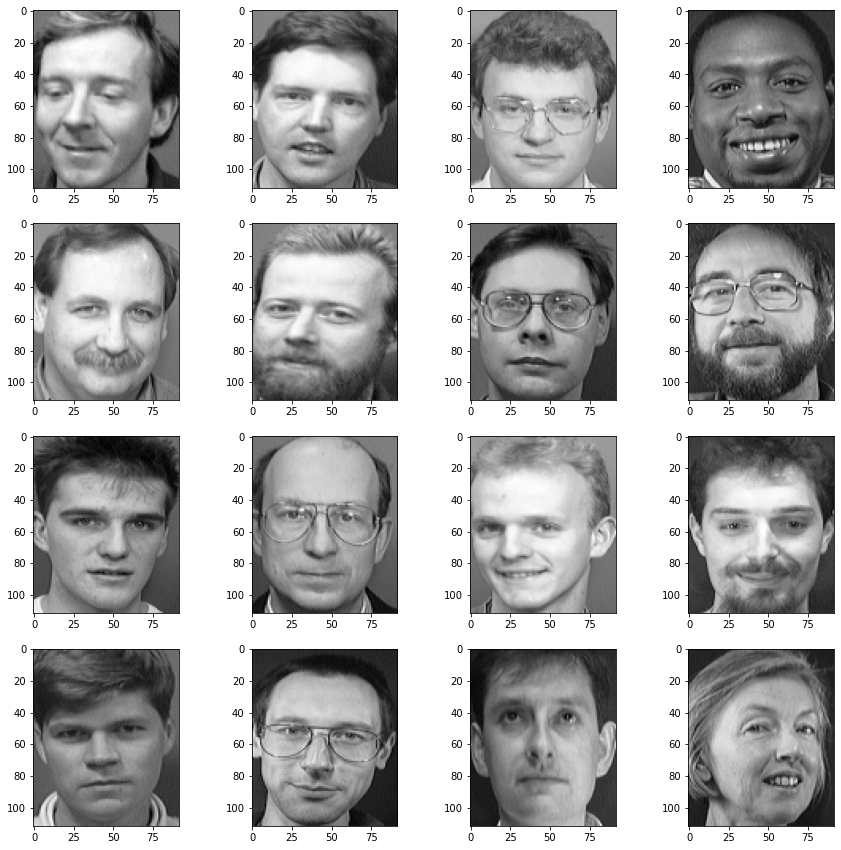

In [249]:
fig = plt.figure(figsize=(15, 15)) # Creates the canvas and specifies the size
col = 4
row = 4
folder = 'face_data/'
index = 1
dirnames = random.sample(os.listdir(folder), 16) # Randomly selected 16
for dirname in dirnames:
    # Find the file path
    filename = random.choice(os.listdir(folder + dirname))
    path = '%s/%s/%s' % (folder, dirname, filename)
    # Open the file 
    with open(path, 'rb') as image:
        img = cv2.imdecode(np.frombuffer(image.read(), np.uint8), cv2.IMREAD_GRAYSCALE)
    fig.add_subplot(row, col, index)
    plt.imshow(img, cmap="gray")
    index = index + 1
plt.show()

### 2. Report the face image size, number of images and number of classes.

In [250]:
print("The image size: " + str(img.shape))

list_class = os.listdir(folder)
print("Number of classes: " + str(len(list_class)))

number_each_class = len(folder)
number_image = len(list_class) * number_each_class
print("Number of images: " + str(number_image))

The image size: (112, 92)
Number of classes: 40
Number of images: 400


## Part 2 - Train Test Split

### 1. Generate Train and Test set from the dataset in the following manner.

### 2. Select the first nine images of each subject for the Train set.

### 3. Select the last image of each subject for the Test set.

### 4. Flatten each image into 1D vector so that the dataset size is N ×L, where N is the number of samples in the train/test set and L is the length of flattened image (L = 92 ×112 = 10304)

### 5. Report the number of images in Train set and Test set.

In [251]:
trainset = np.zeros((40 * 9, 112 * 92)) # Store the 1D data of the trainset, the image size is 112 * 92
trainset_number = np.zeros(40 * 9).astype(np.int8) # Store the index of trainset
testset = np.zeros((40 * 1, 112 * 92)) # Store the 1D data of the testset
testset_number = np.zeros(40 * 1).astype(np.int8) # Store the index of testset

original_train = [] # The original data of the trainset
original_test = [] # The original data of the testset

for i in range(1, 41):
    people_num = i
    for j in range(1, 11):
        # Select the first nine images of each subject for the Train set
        if j <= 9:
            filename = folder+'/s'+str(people_num)+'/'+str(j)+'.pgm'
            img = mpimg.imread(filename)
            original_train.append(img) # Store original data
            img = img.flatten().astype(np.float) # Flatten each image into 1D vector
            trainset[(i - 1) * 9 + (j - 1),:] = img
            trainset_number[(i - 1) * 9 + (j - 1)] = people_num
        # Select the last image of each subject for the Test set
        else:
            filename = folder+'/s'+str(people_num)+'/'+str(j)+'.pgm'
            img = mpimg.imread(filename)
            original_test.append(img) # Store original data
            img = img.flatten().astype(np.float) # Flatten each image into 1D vector
            testset[(i - 1) * 1 + (j - 9) - 1,:] = img
            testset_number[(i - 1) * 1 + (j - 9) - 1] = people_num

# The number of images in train set and test set
print("Number of images in Train set: " + str(len(trainset_number)))
print("Number of images in Test set: " + str(len(testset_number)))
print("Length of flattened image: " + str(len(trainset[0])))

Number of images in Train set: 360
Number of images in Test set: 40
Length of flattened image: 10304


## Part 3 - Apply PCA to Get Eigenfaces

### 1. Apply PCA using scikit-learn on the Train set

### 2. Take first 20 principal components in the feature space. These are known as eigenfaces.

### 3. Visualize the first 16 eigenfaces. For visualization, reshape the flattened vector to original image shape.

Extracting the top 20 eigenfaces from 360 faces


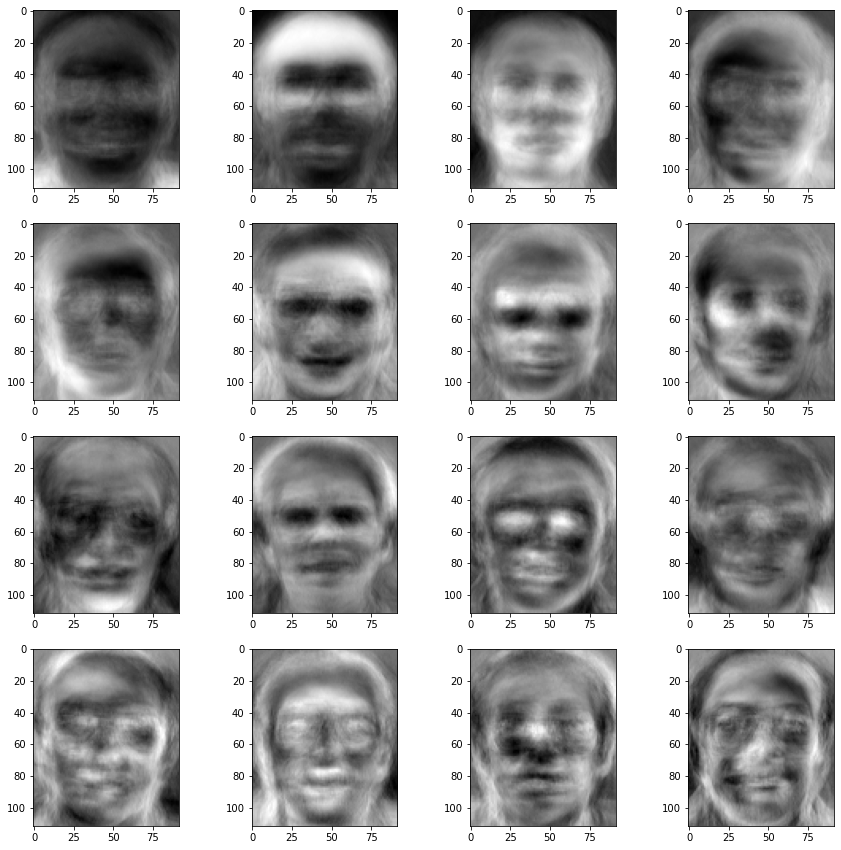

In [252]:
scaler = StandardScaler()
trainset = scaler.fit_transform(trainset)
testset = scaler.transform(testset)

n_components = 20 # Take first 20 principal components
print(
    "Extracting the top %d eigenfaces from %d faces" % (n_components, trainset.shape[0]))
# Apply PCA using scikit-learn on the Train set
pca = PCA(n_components=n_components, svd_solver="randomized", whiten=True).fit(trainset)

eigenfaces = pca.components_.reshape((n_components, 112, 92)) # Reshape the flattened vector to original image shape

# Visualize the first 16 eigenfaces
fig = plt.figure(figsize=(15, 15))
for i in range(1, 17):
    img = eigenfaces[i - 1]
    fig.add_subplot(row, col, i)
    plt.imshow(img, cmap="gray")
plt.show()

## Part 4 - Face Recognition

### 1. Calculate the weights of the training samples using the given formula

In [253]:
train_sample_weights = np.matmul(pca.components_, (trainset - pca.mean_).T)
print(train_sample_weights)

[[-45.62468198 -75.76333343 -57.22871554 ... -45.85413572 -31.34342282
  -51.772056  ]
 [ -0.56960128  28.36150174  30.36251114 ...  -9.23509151  -7.05075694
   -5.23600699]
 [ 58.33641633  -1.15203468  37.29814071 ... -29.0886094  -39.42523483
  -21.44701117]
 ...
 [-14.94270909  -7.70848003  -1.08623953 ...  -1.5245741  -11.53347257
  -11.4464049 ]
 [  4.03229223  -3.12676997   8.98164922 ...  12.53255706   5.78079654
   -7.67564984]
 [  5.80716919  22.12090272  10.73370916 ...   2.30615288 -13.39734207
    7.40929429]]


### 2. For each test image, calculate weights similarly

In [254]:
test_sample_weights = np.matmul(pca.components_, (testset - pca.mean_).T)
print(test_sample_weights)

[[-6.08550014e+01 -6.96755417e+00 -2.66122854e+01 -2.40322159e+01
  -7.13330573e+01 -7.51722349e+01 -2.78150702e+01 -3.88964533e+01
  -1.27082721e+01 -3.33397430e+01  3.59624622e+01 -4.87352153e+01
  -4.80122390e+01  5.40599119e+01 -5.81428790e-01 -1.46921500e+01
  -1.49981979e+01 -7.63541036e+01  3.01124461e+00  4.68219113e+01
   2.05669491e+01  8.80687964e+01 -1.75987917e+01  3.26481082e+01
  -3.21700594e+01 -2.85970043e+01  9.33548076e+00  1.33867183e+00
   6.57348240e+01  3.35201724e+01  3.32507374e+01 -1.47172027e+01
   7.70796808e+01  8.07546078e+01 -3.51351788e+01 -1.08948703e+01
  -1.69903359e+01  1.24319999e+01  8.48309625e+01 -2.06637955e+01]
 [ 2.44078356e+01  3.63205157e+01 -7.28525114e+00 -2.31539742e+01
  -5.32964078e+00 -7.14885858e+01 -9.58101602e+00 -2.07780880e+01
  -3.64706824e+01 -3.84429459e+01 -9.18372504e-01 -7.05502685e+00
   2.67135539e+01  5.59606248e+01 -1.29146547e+01 -1.53606288e+01
  -3.98667041e+01 -8.86084491e+00  5.21126178e+01 -4.16540030e+01
  -3.2448

### 3. Take the minimum euclidean distance between the test image weight and all the training sample weights to predict the class of the test image

In [255]:
train_sample_weights = train_sample_weights.T
test_sample_weights = test_sample_weights.T

similar_index = []
for i in range(0, 40): # Each test image
    distance = [] # Store Euclidian distance
    for j in range(0, 360): # Each train image
        minDistance = np.linalg.norm(train_sample_weights[j] - test_sample_weights[i]) # Calculate Euclidian distance
        distance.append(minDistance)
    similar_index.append(np.argmin(distance)) # Find the nearest distance

res = [] # Find the class
for each in similar_index:
    res.append(trainset_number[each])
print(res)

[1, 2, 3, 4, 40, 6, 7, 8, 9, 8, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40]


### 4. For each test image, Visualize the test image and the train image with minimum distance

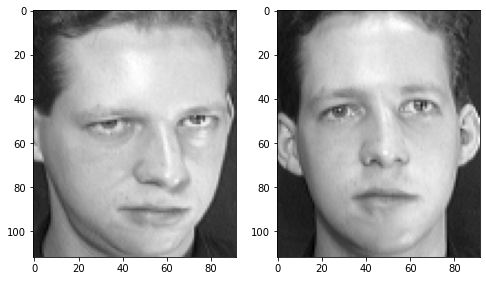

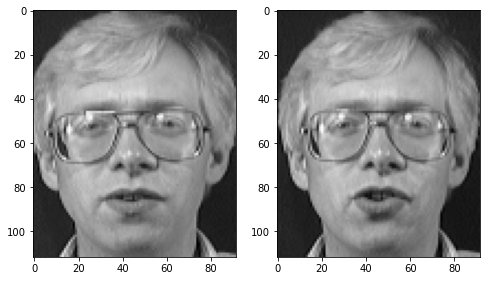

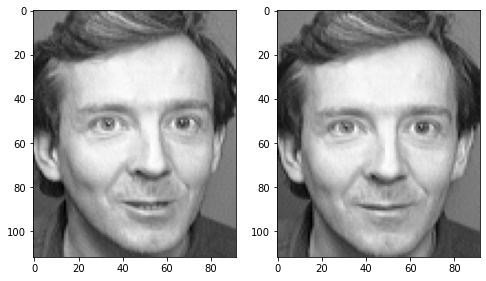

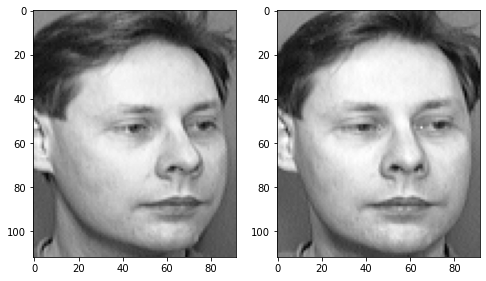

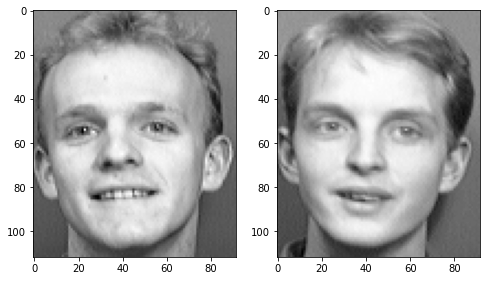

...

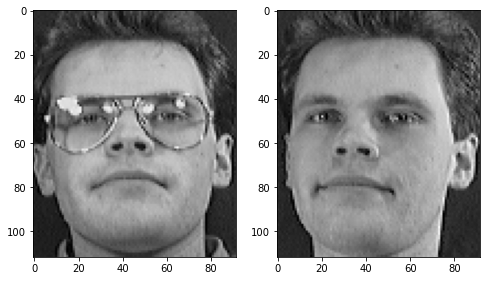

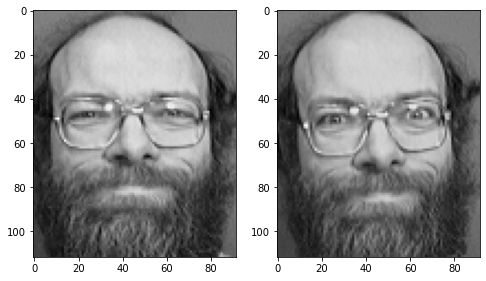

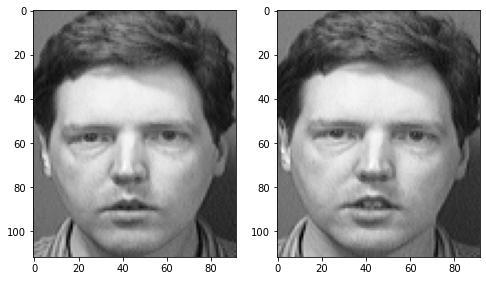

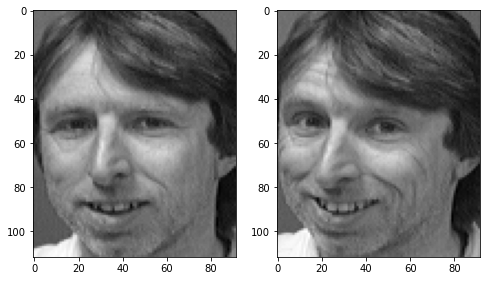

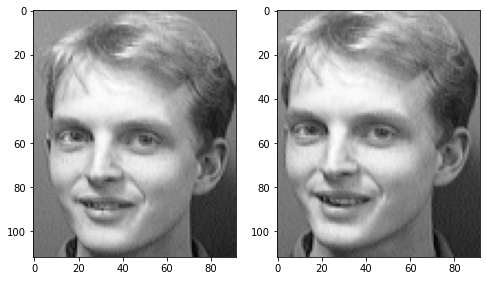

In [256]:
for i in range(1, 41):
    fig = plt.figure(figsize=(8, 8))
    fig.add_subplot(1, 2, 1)
    plt.imshow(original_test[i - 1], cmap="gray") # Test image
    fig.add_subplot(1, 2, 2)
    plt.imshow(original_train[similar_index[i - 1]], cmap="gray") # The train image with minimum distance
    plt.show()

### 5. Report accuracy and total explained variance ratio by the selected components

In [257]:
count = 0 # The number of wrong predict
index = 0
for i in res:
    if i != index + 1:
        count = count + 1
    index = index + 1
print("The accuracy of first 20 principal components:" + str(float(40 - count) / float(40)))
print("The total explained variance ratio of first 20 principal components:" + str(sum(pca.explained_variance_ratio_)))

The accuracy of first 20 principal components:0.95
The total explained variance ratio of first 20 principal components:0.6954736141113826


## Part 5 - Face Recognition

### 1. Repeat Part 3 using only first two principal components instead of 20. Visualize the first two eigenfaces

Extracting the top 2 eigenfaces from 360 faces


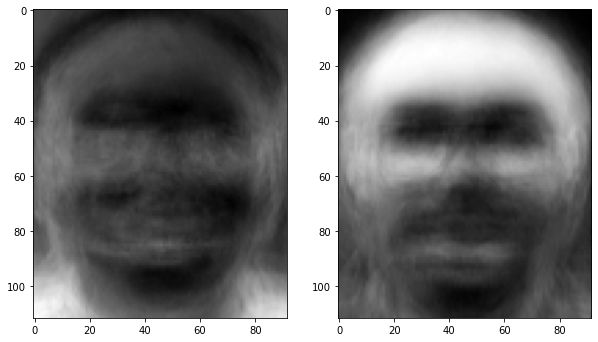

In [258]:
n_components = 2 # Take first 20 principal components
print(
    "Extracting the top %d eigenfaces from %d faces" % (n_components, trainset.shape[0]))
# Apply PCA using scikit-learn on the Train set
pca_2 = PCA(n_components=n_components, svd_solver="randomized", whiten=True).fit(trainset)
# Reshape the flattened vector to original image shape
eigenfaces_2 = pca_2.components_.reshape((n_components, 112, 92))
# Visualize the first 2 eigenfaces
fig = plt.figure(figsize=(10, 10))
for i in range(1, 3):
    img = eigenfaces[i - 1]
    fig.add_subplot(1, 2, i)
    plt.imshow(img, cmap="gray")
plt.show()

### 2. Repeat Part 4

#### 2.1. Calculate the weights of the training samples using the given formula

In [259]:
train_sample_weights_2 = np.matmul(pca_2.components_, (trainset - pca_2.mean_).T)

#### 2.2. For each test image, calculate weights similarly

In [260]:
test_sample_weights_2 = np.matmul(pca_2.components_, (testset - pca_2.mean_).T)

#### 2.3. Take the minimum euclidean distance between the test image weight and all the training sample weights to predict the class of the test image

In [261]:
train_sample_weights_2 = train_sample_weights_2.T
test_sample_weights_2 = test_sample_weights_2.T

similar_index_2 = []
for i in range(0, 40):
    distance = [] # Store Euclidian distance
    for j in range(0, 360):
        minDistance = np.linalg.norm(train_sample_weights_2[j] - test_sample_weights_2[i]) # Calculate Euclidian distance
        distance.append(minDistance)
    similar_index_2.append(np.argmin(distance)) # Find the nearest distance

res_2 = []
for each in similar_index_2:
    res_2.append(trainset_number[each])
print(res_2)

[18, 37, 40, 7, 5, 6, 35, 8, 17, 9, 31, 12, 13, 34, 17, 8, 17, 18, 28, 30, 21, 22, 9, 24, 40, 5, 28, 19, 39, 31, 31, 26, 33, 34, 5, 40, 37, 23, 39, 25]


#### 2.4. For each test image, Visualize the test image and the train image with minimum distance

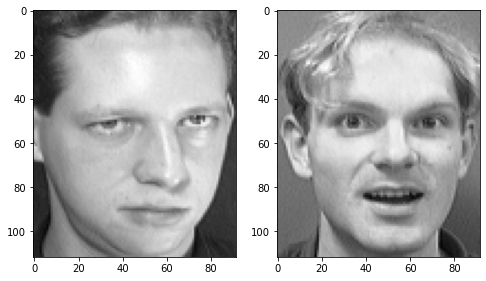

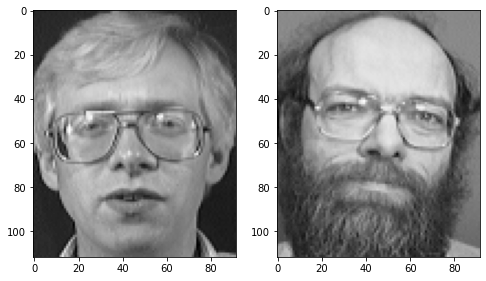

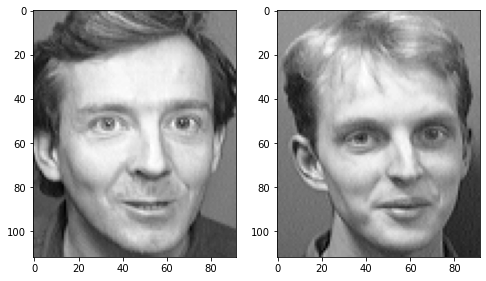

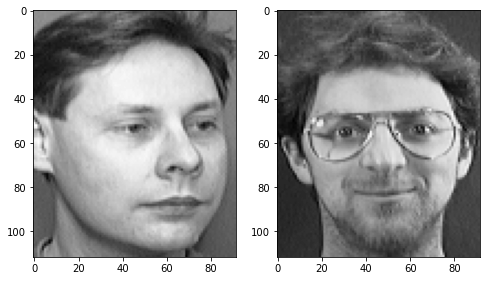

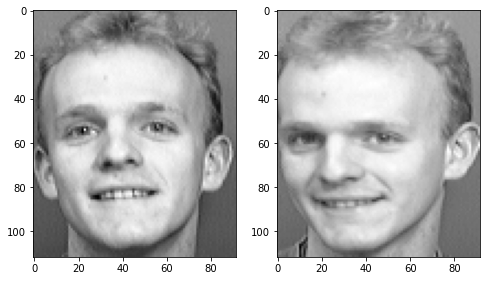

...

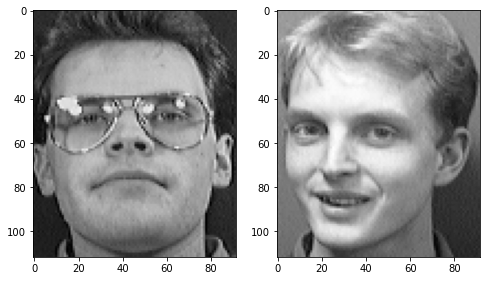

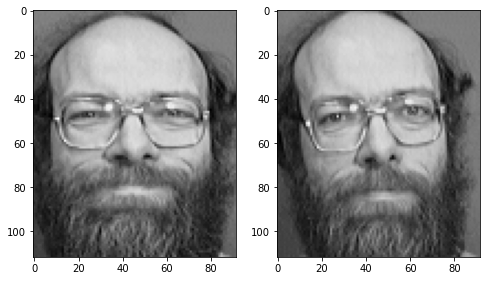

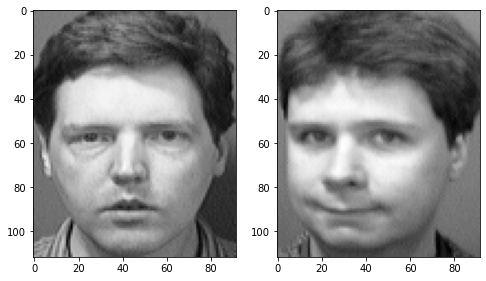

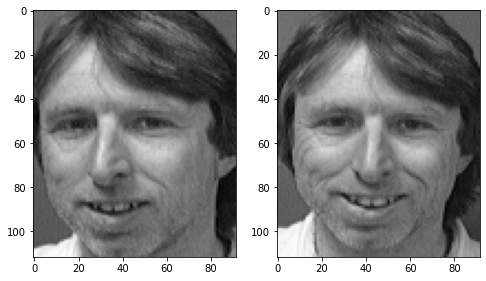

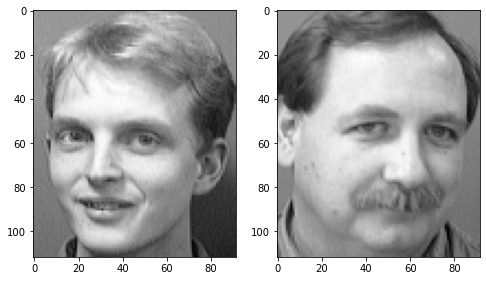

In [262]:
for i in range(1, 41):
    fig = plt.figure(figsize=(8, 8))
    fig.add_subplot(1, 2, 1)
    plt.imshow(original_test[i - 1], cmap="gray") # Test image
    fig.add_subplot(1, 2, 2)
    plt.imshow(original_train[similar_index_2[i - 1]], cmap="gray") # The train image with minimum distance
    plt.show()

#### 2.5. Report accuracy and total explained variance ratio by the selected components

In [263]:
count_2 = 0
index_2 = 0
# Calculate the accuracy
for i in res_2:
    if i != index_2 + 1:
        count_2 = count_2 + 1
    index_2 = index_2 + 1
print("The accuracy of first 2 principal components:" + str(float(40 - count_2) / float(40)))
print("The total explained variance ratio of first 2 principal components:" + str(sum(pca_2.explained_variance_ratio_)))

The accuracy of first 2 principal components:0.375
The total explained variance ratio of first 2 principal components:0.28585491291282616


### 3. Compare the results using the explained variance ratio of PCA

In [264]:
print("The explained variance ratio of first 20 principal components:" + str(pca.explained_variance_ratio_))
print("The total explained variance ratio of first 20 principal components:" + str(sum(pca.explained_variance_ratio_)))
print("The explained variance ratio of first 2 principal components:" + str(pca_2.explained_variance_ratio_))
print("The total explained variance ratio of first 2 principal components:" + str(sum(pca_2.explained_variance_ratio_)))

The explained variance ratio of first 20 principal components:[0.15842818 0.12742673 0.08206044 0.05779132 0.04947382 0.03138806
 0.02482998 0.0217958  0.02093417 0.01948993 0.01438802 0.0131587
 0.01164532 0.0111796  0.01006655 0.00904037 0.00892188 0.00821429
 0.00785629 0.00738417]
The total explained variance ratio of first 20 principal components:0.6954736141113826
The explained variance ratio of first 2 principal components:[0.15842818 0.12742673]
The total explained variance ratio of first 2 principal components:0.28585491291282616


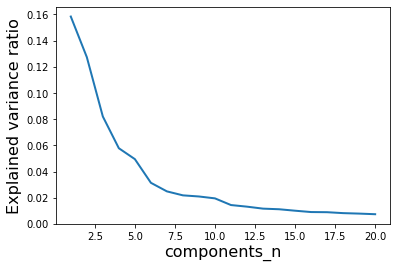

In [265]:
plt.figure()
plt.plot(np.arange(1,21),pca.explained_variance_ratio_,linewidth=2)
plt.xlabel('components_n', fontsize=16)
plt.ylabel('Explained variance ratio', fontsize=16)
plt.show()

We can see that the explained variance ratio of the first two principal conmponents are the same in part3 and part5. But the total explained variance ratio of first 20 principal components is almost 0.7 which is much more bigger than the total explained variance ratio of first 2 principal components which is 0.29. The accurcy of using 20 principal components is 0.95 while the accurcy of using 2 principal components is only 0.375. The efect is much better when using 20 principal components.

And the reason can be found from the figure, we can see that the explained variance ratio keeps being a large number when n is smaller than 7. In other words, the first 7 principal components can significantly improve the accuracy of PCA. Although I didn't do this, we can control the number of k by thresholding in the function. This balances the accuracy of result and the resources consumed.